# What I did

## ECMWF requests

I have now downloaded the ENS Extended forecast for the full year of 2017, and I'm two-thirds of the way through downloading 2018.

The script interacting with the server has been reinforced with additional reporting and checks: it now monitors the amount of storage I have available, handles a few of the server errors I've been getting and keeps me updated on its progress so that I can intervene if there are any problems.

An accumulated one year of the independent last four weeks of the ENS Extended forecast takes up about 300GB, so I will soon run up to the 1TB storage at the __HPC Research Data Store (RDS)__, especially as I start working on the data products derived from this data. This means I'll soon need to extend the storage by [purchasing more](https://www.hpc.cam.ac.uk/research-data-storage-services) (Cold Storage should probably be sufficient at 5TB for £150/year)

After completing the download of the two years of the ENS Extended data, I'll look into running scripts to request the ENS Reforecasts (the additional runs of 11 ensembles initialized on the same date but in each of the previous 20 years - i.e. further 220 data series, twice a week. See [**report 2022-W23**]).

## ECMWF analysis
*Lists of variables and figures are in the appendix.*

### Loading and viewing data

I've been writing code that allows me to work with the Ensemble datasets and comb through them effectively. I'm continuously cycling through the exploration process and extracting any repeated loading, post-processing and plotting code into proper functions in a dedicated source code package.


A few of them (radiation, runoff,...) appear to be cumulative, so I've been looking at converting them to individual increments, but care needs to be taken with respect to the varying time intervals. Also, it's not a purely monotonic function, there are some negative increments, which is strange, so I'm investigating why, and whether that is just some floating point inaccuracy.

### Independence exploration

As mentioned in the group meeting, I've been looking at the independency measure of the ensembles. Currently, I've settled on the correlation across the spatial points, which I need to renormalize relative to the interannual spatial correlation. I have a few years of ERA5 data for it but haven't yet managed to match them to obtain the baseline.

Another question is how to do an intercomparison between more than two members. Currently, I'm using the mean of all the 50*49/2 pairs of correlations, but I have looked into a multivariate generalization of correlation ([here](https://stats.stackexchange.com/questions/588968/why-is-correlation-only-defined-between-two-variables/589051#589051) is a nice summary of options). However, I struggle with the question "Will using something like the __joint cumulant__ make it less intuitive and understandable for the people reading the paper/thesis?"  


### Comparison to the normal weather distribution (ERA5)

I have looked through the GCM literature to find ways to compare weather distributions with each other and determine aspects like the dataset's bias. The best summary is this Euro-Cordex (downscaled GCM) evaluation paper [Kotlarski et al. 2014, sec. 3.2], describing and showing the common metrics such as BIAS, PACO and CRCO (different correlations), RSV and RIAV (ratios of standard deviations)...

## PhD Second year assesment

For my assessment, I first met with Prof Jon Crowcroft to get feedback on the August report and find out what updates should I include in the revised version. I have made the modifications, describing my work on the ML pipeline from Michaelmas and the ECMWF ENS work, their consequences on the structure of my thesis, and submitted the report for re-evaluation.

In the viva, we went through the thesis structure, and they seemed to be content with my work, completed and planned, forming the three pillars of it. They've recommended that all of my current work regarding the non-trivial access and procurement of the ECMWF ENS dataset should not be swept under the carpet, as piecing together the multi-ensemble dataset from the archive is a contribution to the field on its own, similar to what a historian would do, and the process should be described in the thesis.

I've got recommendations regarding the way the thesis is written, and a suggestion to create the document and start working on it as I go along.

They warned me about my planned papers potentially taking away focus from the thesis and suggested doing that after the submission.

I should recieve further formal feedback later.


## Other responses to the feedback to my Lent plan

- Yes, 1 year of ECMWF ENS Extended data is enough for some analysis, but multiple years of it would help constrain its usability for extreme weather and other uncommon patterns. Also if e.g. the 2017 winter season was specific in some regard, this will make comparison to seasonal averages of ERA5 imperfect.

- The ENS analysis questions are all about "Can this __synthetic__ dataset be used for energy modelling?" to which the answer is "Yes, but with some possible caveats." And I'm trying to constrain the caveats. This is similar in nature to the analysis of GCM datasets such as in the paper mentioned above.

 - About the ML architectures, I have got an idea about the sizing from what I've received from Minghua's group, but it will be specific to my datasets which are different (e.g. their data is drawn from a uniform distribution of loads between the min and max, mine is a different, more gaussian-like distribution)

- I've got some information that the June ICML might not have a workshop for Climate Change AI this year, only the December NeurIPS. This would mean looking at potentially writing something up for it, in the summer.

# Insights

At the __Green Careers fair__, I spoke to the recruiters for Octopus Energy, the renewable-only energy retailer, about my work. They said they have a division working on similar things and that there is definitely an opportunity for collaboration or some internship. I was given a contact to Ross Jones-Davies, their talent lead, and was suggested to send a speculative application describing some of my work.

At the __Deep dive into Low Carbon Electricity__ at the Newton Institute, I spoke to Dr Iain Staffel (Imperial), who's, among other things, behind the [renewables.ninja](https://www.renewables.ninja/). We spoke about the ENS Ensembles, and I got some feedback I've incorporated. We talked about the Load model, where his to-be-published load.ninja, a semi-empirical model with only 6 parameters predicting the form of the modern world load from the weather, is something that could be easily adapted for the ECMWF ENS data.

# References

Kotlarski, S. et al. (2014) ‘__Regional climate modeling on European scales: A joint standard evaluation of the EURO-CORDEX RCM ensemble’__, Geoscientific Model Development, 7(4), pp. 1297–1333. Available at: [https://doi.org/10.5194/GMD-7-1297-2014](https://doi.org/10.5194/GMD-7-1297-2014)


In [1]:
#%%  Import all the packages needed to explore grib data
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy

from pathlib  import Path

import sys
# insert path to src folder no matter from where the notebook is run
sys.path.insert(0, "..")

# import my stuff:
from src.plotting.plot_ens import (colors_ens, plot_ens_lineplot,get_country_record,
                                   plot_ens_tripleplot)
from src.data_loading.load_ens import (calculate_wind_speed,
                                       load_ens_data_ED)
from src.preprocessing.reducers import  average_over_shape 
# auto reload imports
%load_ext autoreload
%autoreload 2
#%% wider plots
# wider plots
plt.rcParams['figure.figsize'] = [10, 5]
from IPython.core.interactiveshell import InteractiveShell
# just the last output
InteractiveShell.ast_node_interactivity = "last_expr"
import warnings
warnings.filterwarnings('ignore')

# =======================================
#%% Flags and directories
## Flags and directories
# =========================================
load_full_D = True
drop_wind_components = True
validate_function = False
if validate_function:
    from src.tests.test_functions import validate_function_average_over_shape

dir_data = Path('../data/ecmwf-ens')
fn_E = dir_data /"mars_v04e_2017-01-02_Mon.grib"
fn_D = dir_data /"mars_v04d_2017-01-02_Mon.grib"

dir_fig = Path('../report/figures')

latlon_london = (51.5074, 0.1278)


# Appendix: ENS Dataset loading and visualization
## Variables available


In [2]:
#%% Load the data
## Load the data
# =========================================

ds, dsD = load_ens_data_ED(fn_E, fn_D,
                           load_full_D=load_full_D,
                           drop_wind_components=drop_wind_components,
                           )



In [3]:
#%% print variables
## print variables
# =========================================
#print bold header and title
print("ECMWF ENS Extended data variables :\n")
print(f"{'var':6s} {'units':10s} {'long_name':30s}")
print("-"*50)
for v in ds.data_vars:
    # table format
    print(f"{v:6s} {ds[v].attrs['units']:10s} {ds[v].attrs['long_name']:30s}")


ECMWF ENS Extended data variables :

var    units      long_name                     
--------------------------------------------------
z      m**2 s**-2 Geopotential                  
sp     Pa         Surface pressure              
t2m    C          2 metre temperature           
ssrd   J m**-2    Surface solar radiation downwards
strd   J m**-2    Surface thermal radiation downwards
ssr    J m**-2    Surface net solar radiation   
ro     m          Runoff                        
stl4   C          Soil temperature level 4      
d2m    C          2 metre dewpoint temperature  
w10    m s**-1    10m wind speed                
w100   m s**-1    100m wind speed               


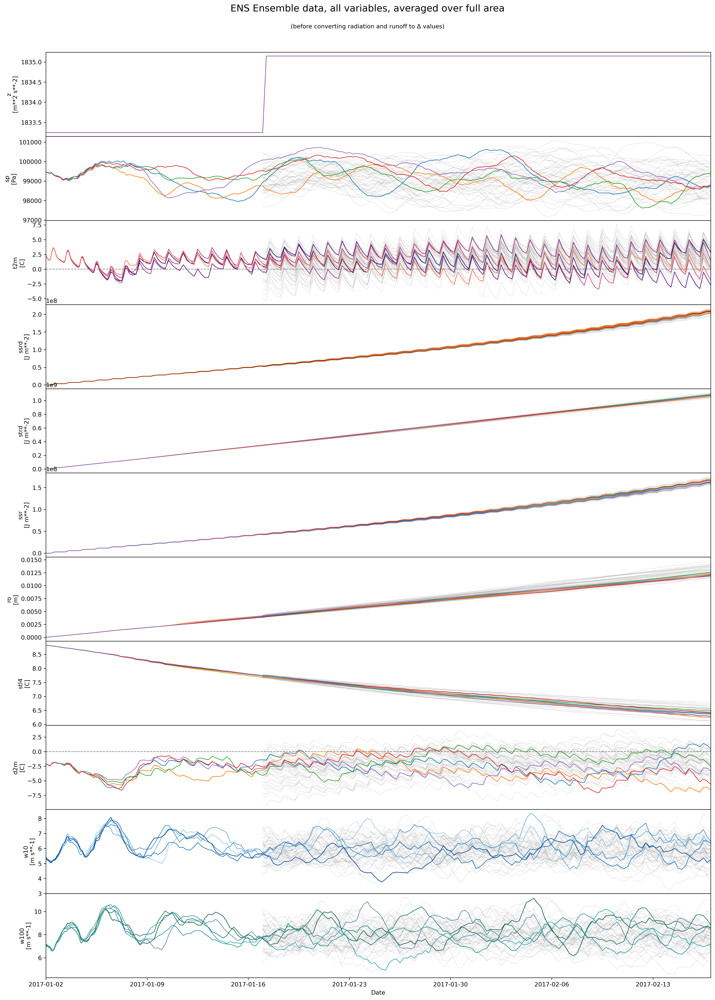

In [50]:
# %% 
fig, ax = plt.subplots(len(ds.data_vars), 1, sharex=True, figsize=(20, 28), dpi=300)

for i,var in enumerate(ds.data_vars):
    show_xlabels = i==len(ds.data_vars)-1
    #supress matplotlib errors
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

    plot_ens_lineplot(ds, var, 'full_area', ax=ax[i],print_var_label=True, dsD=dsD, show_xlabels=show_xlabels)
    ax[i].set_ylabel(f"{var}\n[{ds[var].attrs['units']}]")

# no space between axes
fig.subplots_adjust(hspace=0)
# main title and small subtitle
# main: ENS Ensemble data, all variables, averaged over full area
# sub: (before converting radiation and runoff to Δ values)
# both just above the first plot
fig.suptitle("ENS Ensemble data, all variables, averaged over full area", fontsize=16, y=0.92);
fig.text(0.5, 0.90, "(before converting radiation and runoff to Δ values)", ha='center', fontsize=10);

# the title and sub title are too high even with fig.subplots_adjust(top=0.9)
# fig.subplots_adjust(top=0.80)


## The divergence of the predictions on both the local scale and the continental scale:

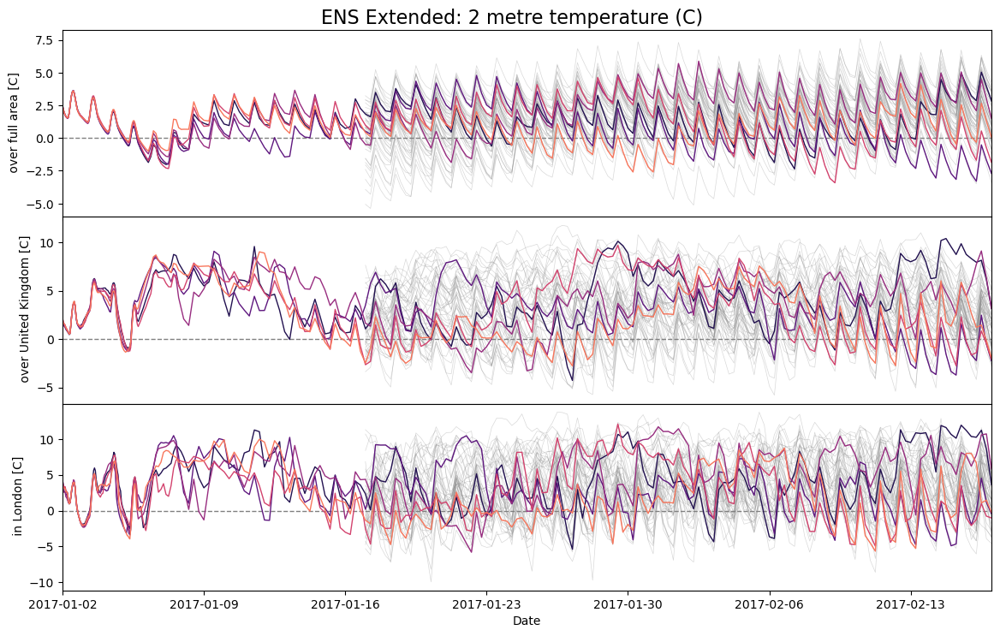

In [51]:

plot_ens_tripleplot(ds, 't2m', dsD=dsD)

# %%

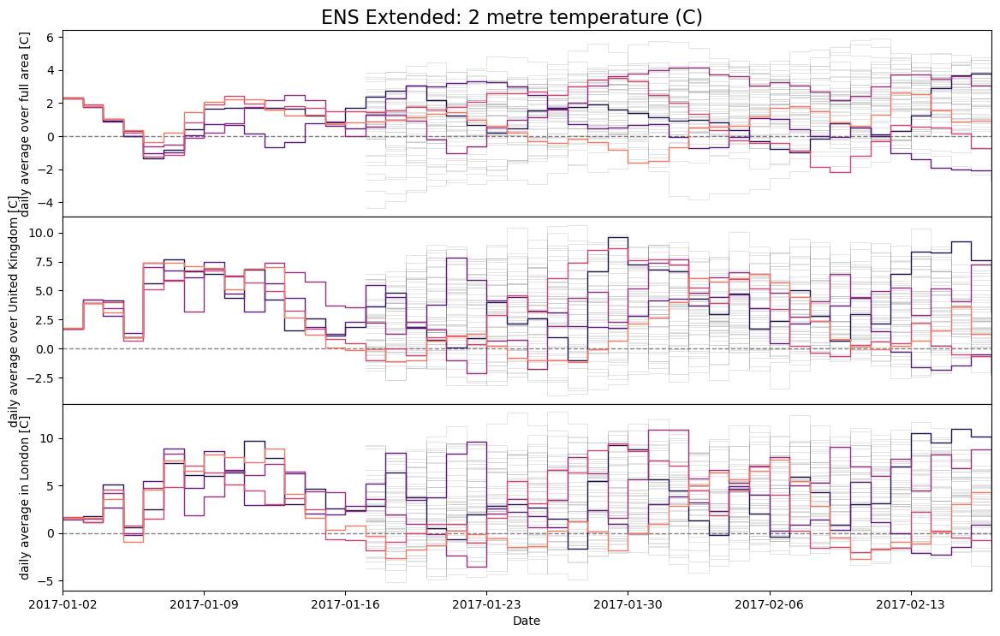

In [52]:
plot_ens_tripleplot(ds, 't2m',dsD=dsD,daily_average=True)

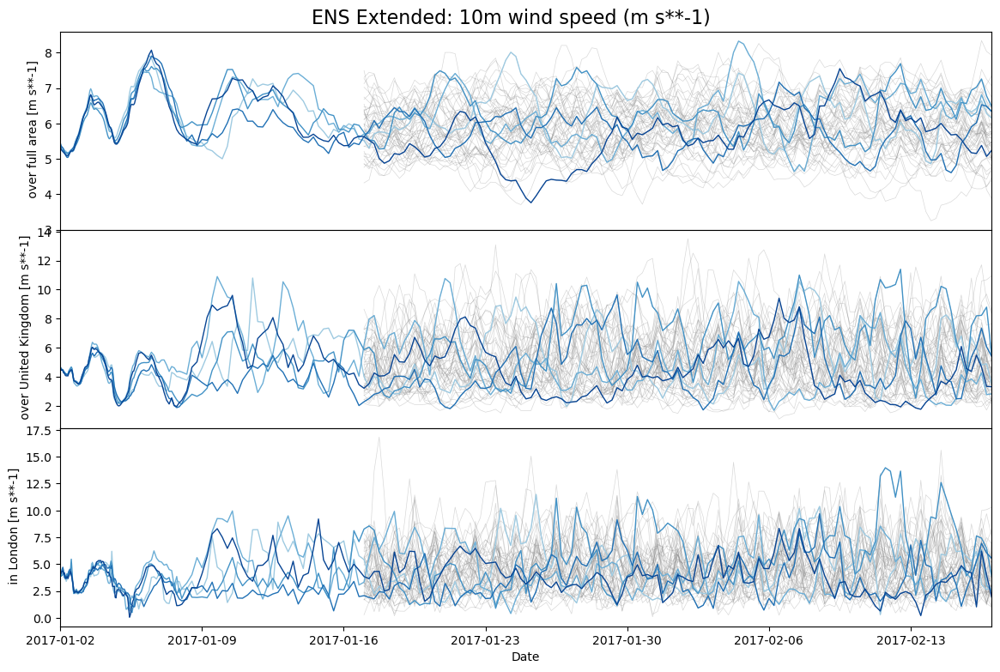

In [30]:
plot_ens_tripleplot(ds, 'w10',dsD=dsD,country_name="United Kingdom" , latlon=latlon_london, point_name='London')

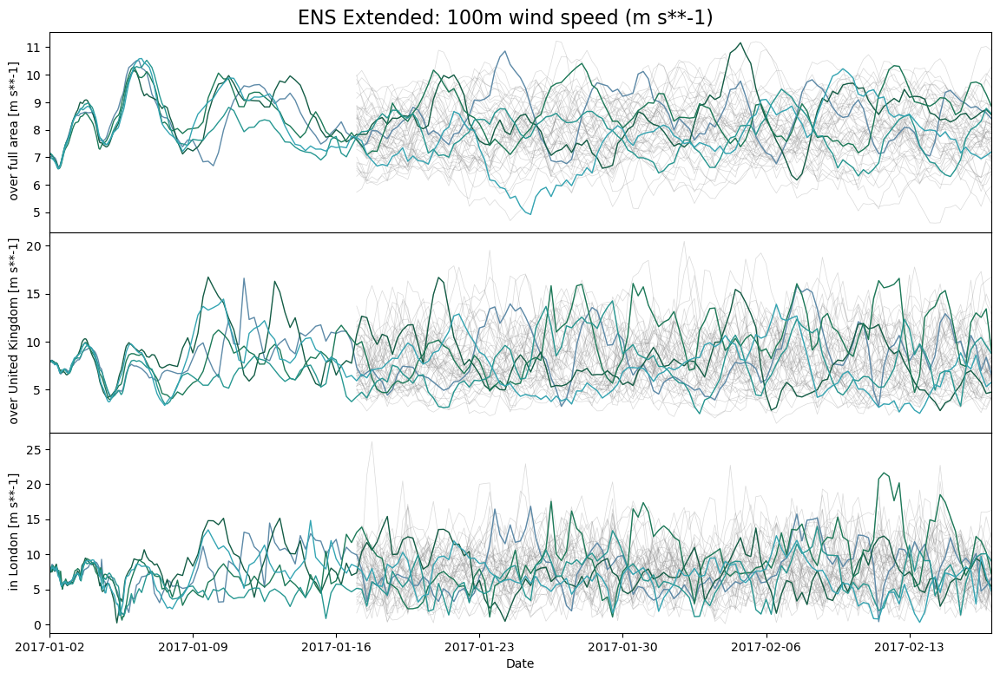

In [31]:
# %%
plot_ens_tripleplot(ds, 'w100',dsD=dsD )



In [9]:
# DS DIFF
# find which variables are only increasing
diff_vars = ["ssrd","strd","ssr", "ro"]
# create a new ds_diff with the diff_vars variables only, copying the attributes, and taking the diff("step") function
ds_diff = ds[diff_vars].copy()
ds_diff.attrs = ds.attrs
ds_diff = ds_diff.diff("step")
ds_step = ds.step.diff("step") / np.timedelta64(1, 'h')

# rescale by the time step between each step
ds_diff = ds_diff / ds_step
dsD_diff = dsD[diff_vars].copy()
dsD_diff.attrs = dsD.attrs
dsD_diff = dsD_diff.diff("step")
dsD_step = dsD.step.diff("step") / np.timedelta64(1, 'h')
dsD_diff = dsD_diff / dsD_step

for v in ds_diff.data_vars:
    ds_diff[v].attrs = ds[v].attrs
    # add Δ to the long_name
    ds_diff[v].attrs['long_name'] = f"Δ {ds[v].attrs['long_name']}"
    # units are the same, but add a /h
    ds_diff[v].attrs['units'] = f"{ds[v].attrs['units']}/h"
for v in dsD_diff.data_vars:
    dsD_diff[v].attrs = dsD[v].attrs
    # add Δ to the long_name
    dsD_diff[v].attrs['long_name'] = f"Δ {dsD[v].attrs['long_name']}"
    dsD_diff[v].attrs['units'] = f"{dsD[v].attrs['units']}/h"


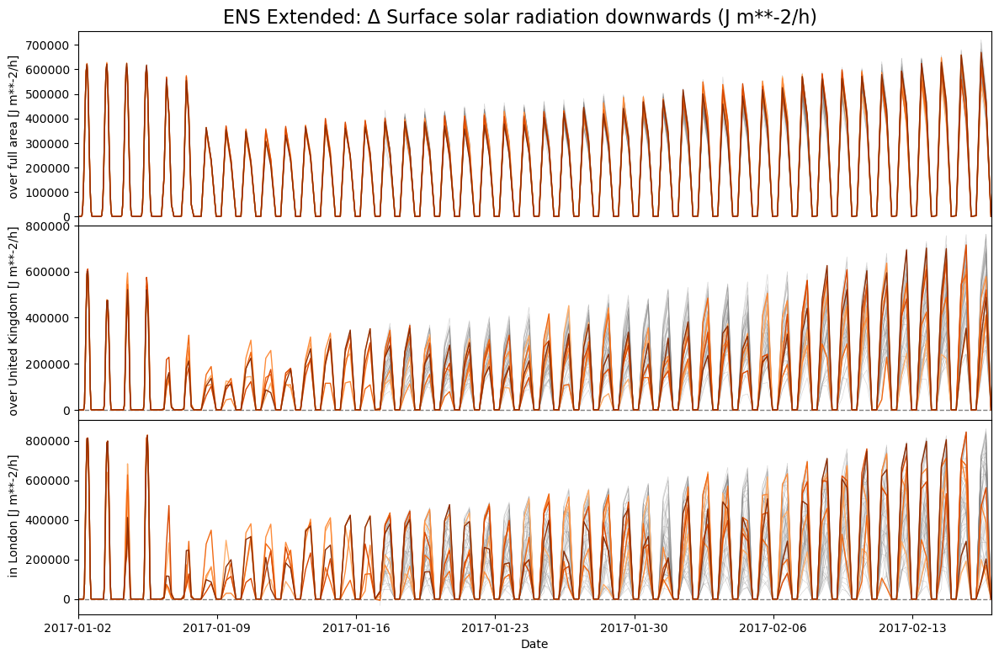

In [32]:
plot_ens_tripleplot(ds_diff, 'ssrd',dsD=dsD_diff,country_name="United Kingdom" , latlon=latlon_london, point_name='London')

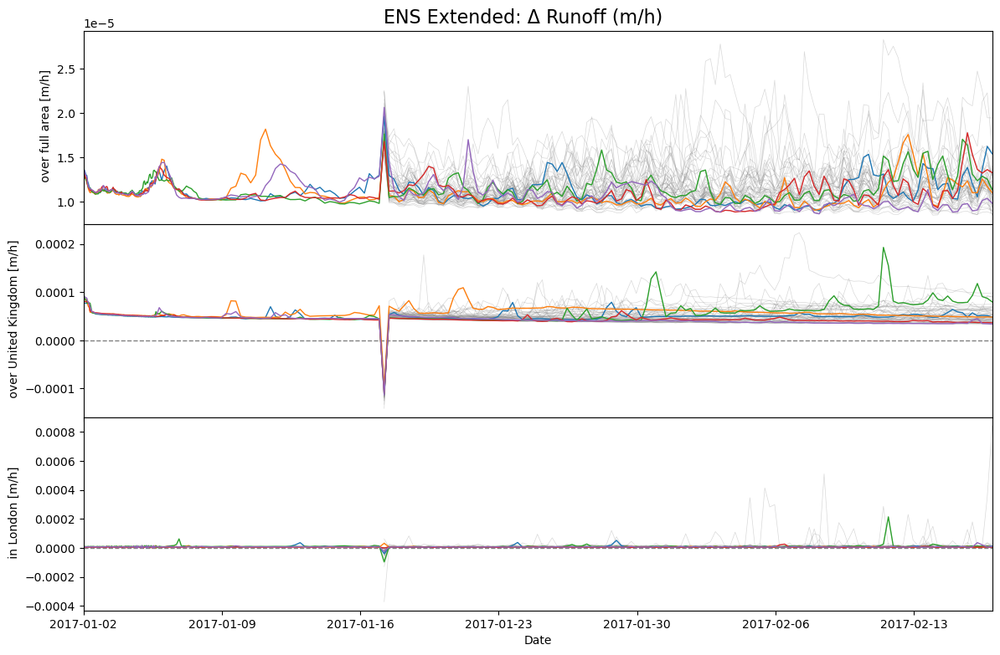

In [33]:
plot_ens_tripleplot(ds_diff, 'ro',dsD=dsD_diff)

## Correlation analysis



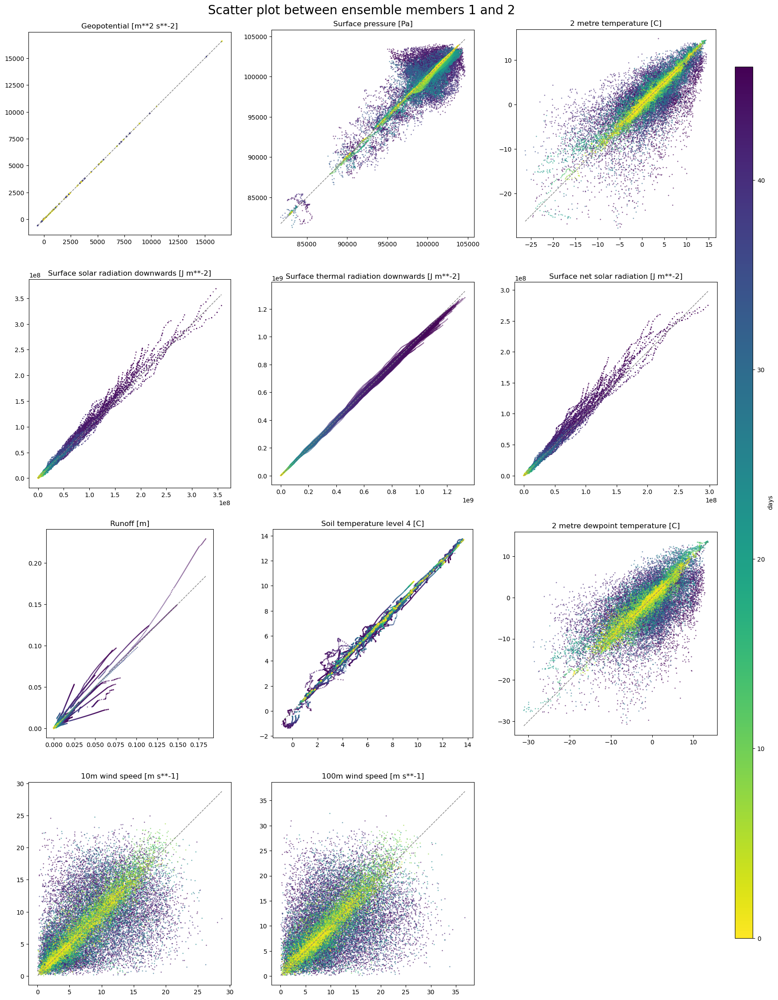

In [37]:
#%% Plot scatter plot of all variables in ds
### Plot scatter plot of all variables in ds
# =======================================


# create a grid of subplots
fig, axes = plt.subplots(4,3, figsize=(20,28))
# flatten the axes array to a list
axes = axes.flatten()


# select random (!) sample of 16 spatial points
ts1 = ds.sel(number=1).isel(latitude=slice(0,100,10), longitude=slice(0,100,10))
ts2 = ds.sel(number=2).isel(latitude=slice(0,100,10), longitude=slice(0,100,10))
cval = ts1.step.values/np.timedelta64(1, 'D')
# tile cval to match the shape of ts1 random variable
 
cval = np.tile(cval, (ts1.t2m.shape[1], ts1.t2m.shape[2], 1)).transpose(2,0,1)

# loop over all variables in the dataset
for i, var in enumerate(ds.data_vars):
    s1 = ts1[var]
    s2 = ts2[var]
    
    # select the axis to plot to
    ax = axes[i]
    # scatter plot but color the points by the valid time
    
    #ax.scatter(s1, s2, s=1, c=cval,alpha=0.5)
    # scatter from end to start
    ax.scatter(s1[::-1], s2[::-1], s=1, c=cval,alpha=0.5, cmap="viridis")
    
    # plot diagonal line
    ax.plot([s1.min(), s1.max()], [s1.min(), s1.max()], "--", color="gray", linewidth=1)

    # no labels
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    #square plot
    ax.set_aspect('equal', 'box')
    
    # add title
    ax.set_title(f"{ds[var].long_name} [{ds[var].units}]")

# remove 16th axes and move the last three plots to the right
fig.delaxes(axes[-1])
    
# add a shared colorbar (smaller size)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
#invert the colorbar color order
cbar  = fig.colorbar(plt.cm.ScalarMappable(norm=plt.Normalize(cval.min(), cval.max()), cmap="viridis_r"), cax=cbar_ax)
cbar.set_label("days")

# add a title for the whole figure
# "Scatter plot between ensemble members 1 and 2"
fig.suptitle(f"Scatter plot between ensemble members 1 and 2", fontsize=20, y=0.9);
# save figure
# fig.savefig(dir_fig/"003-06_scatter_ensemble_1-2.png", dpi=300)


In [15]:

def get_correlation_time_series(ds, var, n_ens=5):
    corr_ds = xr.Dataset()


    for i in range(1,n_ens+1):
        for j in range(i+1,n_ens+1):
            # fill the dataset with the correlation between ensemble i and j
            # add each new data to relevant combination of i and j
            # pick the variable var from ds
            #f string formatting for two places: 01,...,51
            label = f"{i}-{j}" if n_ens < 10 else f"{i:02}-{j:02}"
            corr_ds[label] = xr.corr(ds[var].sel(number=i), ds[var].sel(number=j), dim=["latitude", "longitude"])
            
    # calculate the mean across all variables in ts_corr
    corr_ds = corr_ds.to_array(dim='combination')
    return corr_ds.mean(dim='combination'), corr_ds.std(dim='combination')


avg_t2m_corr, std_t2m_corr = get_correlation_time_series(ds, "t2m")
# do the same for 50 ensemble members of ds_D
avg_t2m_corr_D, std_t2m_corr_D = get_correlation_time_series(dsD, "t2m", n_ens=50)



In [21]:
corr_vars = xr.Dataset()
corr_std_vars = xr.Dataset()

# for all variables in ds extract the correlation time series
for var in ds.data_vars:
    corr_vars[var],corr_std_vars[var] = get_correlation_time_series(ds, var)


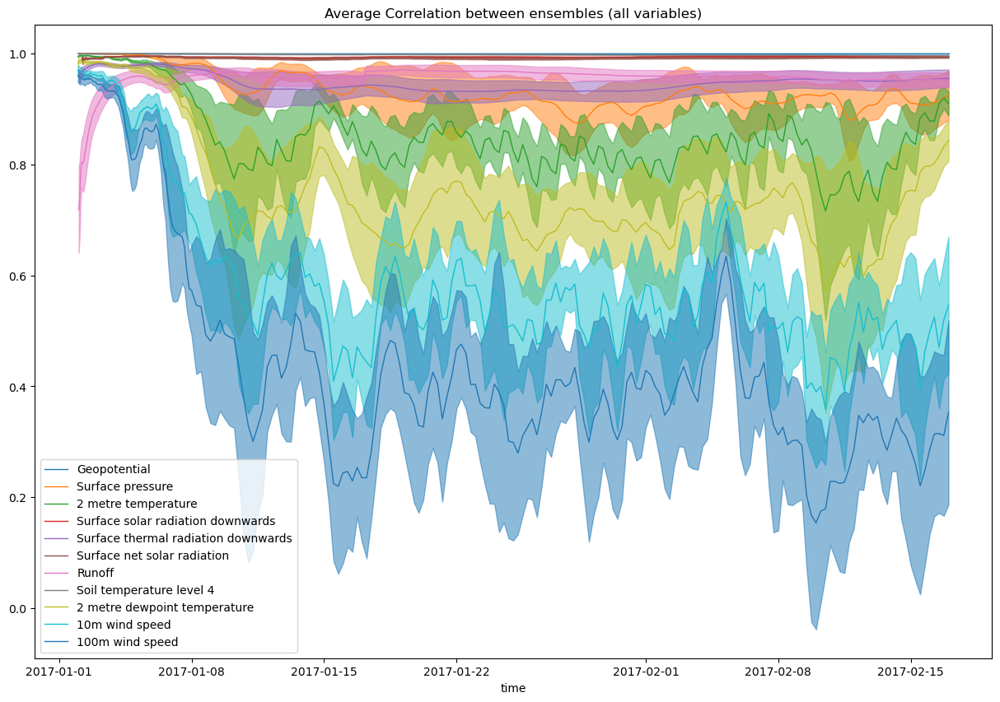

In [25]:
fig,ax = plt.subplots(1,1, figsize=(15, 10))

# plot the mean and std as error bounds
corr_vars.to_array(dim='variable').plot.line(x="valid_time", hue="variable", linewidth=1, ax=ax)
# plot the std as error bounds around the mean
# match the color of the line to the color of the error bounds
colors = [ax.lines[i].get_color() for i in range(len(corr_vars.data_vars))]
for i, var in enumerate(corr_vars.data_vars):
    ax.fill_between(corr_vars.valid_time, corr_vars[var] + corr_std_vars[var], corr_vars[var] - corr_std_vars[var], color=colors[i], alpha=0.5)
# (corr_vars + corr_std_vars/2).to_array(dim='variable').plot.line(x="valid_time", hue="variable", linewidth=1, ax=ax, alpha=0.5)
# (corr_vars - corr_std_vars/2).to_array(dim='variable').plot.line(x="valid_time", hue="variable", linewidth=1, ax=ax, alpha=0.5)
# use long name from ds variables as legend
plt.legend([ds[var].long_name for var in ds.data_vars])
# x tick lables horizontal and centered
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha="center")
# plot vertical grey dashed line at two weeks after the start of the dataset
# ax.axvline(x=ds.valid_time[0] + np.timedelta64(14, 'D'), color='grey', linestyle='--')
# title graph
ax.set_title("Average Correlation between ensembles (all variables)");



This plot above looks at correlation of only 5 ensembles. The line is the mean between all the pais, the shaded region ±1σ. The fewer large scale patterns the variable has, the lower the final correlation. These stable patterns such as the North-South insolation pattern need to be subtracted / divided by to measure the correlation due to variation between ensembles. 

When looking at the pairs between all 50 ensembles, there is a clear asymptote:

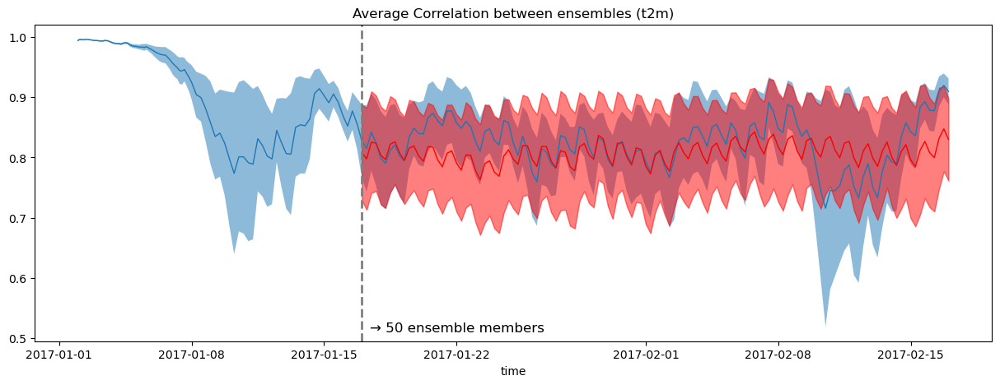

In [17]:
fig, ax = plt.subplots(1,1, figsize=(15, 5))
avg_t2m_corr.plot.line(x="valid_time", ax=ax, linewidth=1)
# plot the std as error bounds around the mean
ax.fill_between(avg_t2m_corr.valid_time, avg_t2m_corr + std_t2m_corr, avg_t2m_corr - std_t2m_corr, alpha=0.5)

# plot the D data
ax.plot(avg_t2m_corr_D.valid_time, avg_t2m_corr_D, color="red", linewidth=1)
ax.fill_between(avg_t2m_corr_D.valid_time, avg_t2m_corr_D + std_t2m_corr_D, avg_t2m_corr_D - std_t2m_corr_D, alpha=0.5, color="red")


# x tick lables horizontal and centered
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha="center")

# plot vertical grey dashed line before the first valid time of the D data
cutoff = avg_t2m_corr_D.valid_time[0].values
ax.axvline(cutoff, color="grey", linestyle="--", linewidth=2)
# add a small text right of this line "→ 50 ensemble members"
ax.text(cutoff + np.timedelta64(10, 'h'), 0.51, "→ 50 ensemble members", fontsize=12)

# set title as "Average Correlation between ensembles (t2m)"
ax.set_title("Average Correlation between ensembles (t2m)");